<a target="_blank" href="https://colab.research.google.com/github/ChuBL/CS504_AdversarialML/blob/main/assg_2/assg2_sub.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install adversarial-robustness-toolbox

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.2/31.2 MB 21.2 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.1
    Uninstalling scikit-learn-1.2.1:
      Successfully uninstalled scikit-learn-1.2.1


In [ ]:
# Import libraries
import sys
from pathlib import Path
import datetime
import tensorflow as tf
import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from os import listdir
import cv2
import natsort
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.models import Model
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dropout
from keras.layers import Dense
from tensorflow.python.keras.models import Sequential
from keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.optimizers.legacy import Adam, SGD
from matplotlib import pyplot as plt
from art.attacks.evasion import BoundaryAttack
from art.estimators.classification import KerasClassifier
from art.utils import to_categorical
from art.attacks.evasion import ProjectedGradientDescent
import imageio
from tensorflow.keras.applications import vgg16
# This line is important, without it the attacks in the ART toolbox won't work
# And it needs to be run before training the models
tf.compat.v1.disable_eager_execution()

# Print the version of tensorflow and keras
print("TensorFlow version:{}".format(tf.__version__))
print("Keras version:{}".format(keras.__version__))

TensorFlow version:2.11.0
Keras version:2.11.0


In [ ]:
p1_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p1/"
p2_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p2/"

# Part I

## Part I. Task 1

### Load dataset

In [ ]:
# Uncompress the dataset 
!unzip -uq "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/SCENES_700x700.zip" -d "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/"

In [ ]:
# Function to load the images and the labels from the dataset
def load_images_and_labels(directory):

    imgs_list = []
    labels_list = []
    labels_dict = {}

    # List of all subfolders in the directory
    subfolders_list_1 = listdir(directory)
    # Make sure that the subfolders are sorted 
    subfolders_list = natsort.natsorted(subfolders_list_1)

    # Assign a label to each folder with images (0 to the first folder)
    lab = 0
    for subfolder_name in subfolders_list:
        sub_dir_path = directory + '/' + subfolder_name

        # Read the images as numpy arrays
        imagesList = listdir(sub_dir_path)
        for i in range(len(imagesList)):
          tmp_img = cv2.imread(os.path.join(sub_dir_path, imagesList[i]))
          # Resize all images to 224 x 224 pixels
          resized_img = cv2.resize(tmp_img, (224, 224)) 
          img_arr = np.array(resized_img)
          imgs_list.append(img_arr.astype(float))
          labels_list.append(lab)
        labels_dict[lab] = subfolder_name
        lab += 1
    
    # Convert the lists to numpy arrays
    imgs = np.asarray(imgs_list)
    labels = np.asarray(labels_list)

    return imgs, labels, labels_dict

data_directory = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/SCENES_700x700"
# Use the above function to load the images and labels
all_images, all_labels, labels_dict = load_images_and_labels(data_directory)

In [ ]:
p1_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p1/"
np.save(p1_path + 'all_images', all_images)
np.save(p1_path + 'all_labels', all_labels)

In [ ]:
print(labels_dict)

{0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}


In [ ]:
#p1_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p1/"
all_images = np.load(p1_path + "all_images.npy")
all_labels = np.load(p1_path + "all_labels.npy")

In [ ]:
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=11)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

In [ ]:
# Display the shapes of train, validation, and test datasets
print('Images train shape: {} - Labels train shape: {}'.format(train_images.shape, train_labels.shape))
print('Images validation shape: {} - Labels validation shape: {}'.format(val_images.shape, val_labels.shape))
print('Images test shape: {} - Labels test shape: {}'.format(test_images.shape, test_labels.shape))

# Display the range of images 
print('\nMax pixel value', np.max(train_images))
print('Min pixel value', np.min(train_images))
print('Average pixel value', np.mean(train_images))
print('Data type', train_images[0].dtype)

# Note that the images are in the [0,255] range, to keep the data consistent with the notebook example of the attack

# In the example, the mean channel values of the images were subtracted: you don't need to apply that, unless you wish to

Images train shape: (2838, 224, 224, 3) - Labels train shape: (2838,)
Images validation shape: (710, 224, 224, 3) - Labels validation shape: (710,)
Images test shape: (888, 224, 224, 3) - Labels test shape: (888,)

Max pixel value 255.0
Min pixel value 0.0
Average pixel value 121.2237339224141
Data type float64


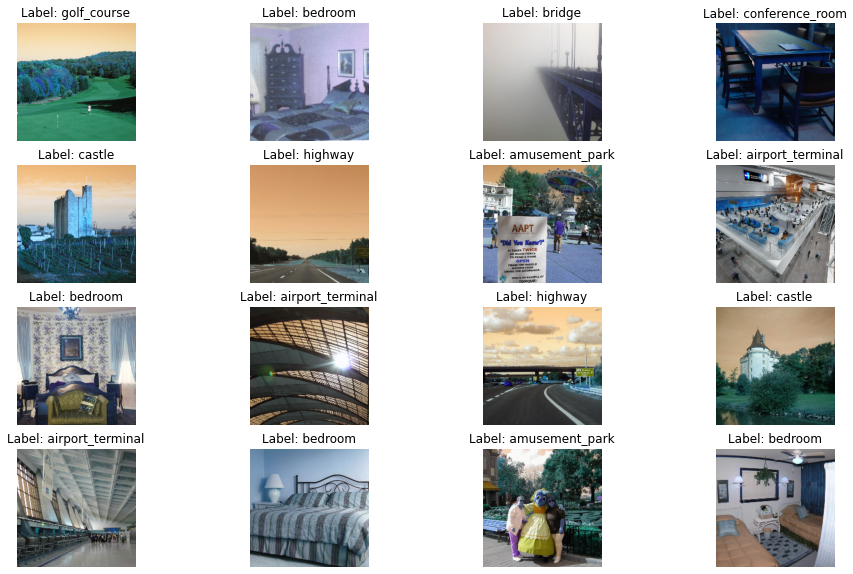

In [ ]:
# A list with the names of the image classes
# label_names = ['airport_terminal', 'amusement_park', 'bedroom', 'bridge', 'castle', 'conference_room',
#                'golf_course', 'highway', 'mountain', 'playground']
               
# Plot a few images to check if the labels make sense
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}
plt.figure(figsize=(16, 10))
for n in range(16):
    i = np.random.randint(0, len(train_images), 1)
    ax = plt.subplot(4, 4, n+1)
    plt.imshow(train_images[i[0]].astype(int))
    plt.title('Label: ' + str(labels_dict[train_labels[i[0]]]))
    plt.axis('off')

### Train NN model

In [ ]:
all_images = np.load(p1_path + "all_images.npy")
all_labels = np.load(p1_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=11)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 10)
test_labels_onehot = keras.utils.to_categorical(test_labels, 10)
val_labels_onehot = keras.utils.to_categorical(val_labels, 10)

In [ ]:
IMG_HEIGHT = 224
IMG_WIDTH = 224
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3))

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# x = Dense(1024, activation='relu')(x)
# x = Dropout(0.25)(x)
# x = Dense(256, activation='relu')(x)
# x = Dropout(0.2)(x)
predictions = Dense(10, activation='softmax')(x)

trans_resnet = Model(inputs=base_model.input, outputs=predictions)
# for layer in base_model.layers[:-1]:
#     layer.trainable = False

# trans_resnet.summary()


# The model we will train

trans_resnet.compile(optimizer=Adam(learning_rate=1e-4),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

PATIENCE = 10
callbacks = [EarlyStopping(monitor='val_loss',
                   patience = PATIENCE,
                   restore_best_weights=True),
             ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-6, verbose=1)
             #LRFinder(min_lr=1e-6, max_lr=1e-3)
            ]

In [ ]:
history = trans_resnet.fit(x= train_images,
    y= train_labels_onehot,
    batch_size=64,
    epochs=50,
    # monitoring validation loss and metrics
    validation_data=(val_images, val_labels_onehot),
    verbose=1,
    callbacks=callbacks
)

Train on 2838 samples, validate on 710 samples
Epoch 1/50
2838/2838 [==============================] - 49s 17ms/sample - loss: 0.4959 - accuracy: 0.8379 - val_loss: 0.5997 - val_accuracy: 0.8676 - lr: 1.0000e-04
Epoch 2/50
2838/2838 [==============================] - 37s 13ms/sample - loss: 0.0305 - accuracy: 0.9926 - val_loss: 0.2901 - val_accuracy: 0.9169 - lr: 1.0000e-04
Epoch 3/50
2838/2838 [==============================] - 37s 13ms/sample - loss: 0.0085 - accuracy: 0.9986 - val_loss: 0.2098 - val_accuracy: 0.9465 - lr: 1.0000e-04
Epoch 4/50
2838/2838 [==============================] - 37s 13ms/sample - loss: 0.0039 - accuracy: 1.0000 - val_loss: 0.1719 - val_accuracy: 0.9535 - lr: 1.0000e-04
Epoch 5/50
2838/2838 [==============================] - 37s 13ms/sample - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.1629 - val_accuracy: 0.9493 - lr: 1.0000e-04
Epoch 6/50
2838/2838 [==============================] - 37s 13ms/sample - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.1480 - v

In [ ]:
model_name = "trans_res.h5"
p1_model_path = os.path.join(p1_path, 'model/', model_name)
print(p1_model_path)

/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p1/model/trans_res.h5


In [ ]:
#save the model
trans_resnet.save(p1_model_path)

#save our history so we dont lose it.
np.save(p1_path + 'model/' + "Trans_ResnetHistoryDict.npy", history.history)

In [ ]:
loaded_model = load_model(p1_path + 'model/' + "trans_res.h5")

In [ ]:
# evals_test = loaded_model.evaluate(test_images, test_labels_onehot)
# print("Classification Accuracy Test: ", evals_test[1])

t = datetime.datetime.now()
evals_test = loaded_model.evaluate(test_images, test_labels_onehot)
print("Classification Accuracy Test: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))



t = datetime.datetime.now()
evals_test = loaded_model.evaluate(val_images, val_labels_onehot)
print("Classification Accuracy Validation: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))



t = datetime.datetime.now()
evals_test = loaded_model.evaluate(train_images, train_labels_onehot)
print("Classification Accuracy Train: ", evals_test[1])
print('Inference time: %s' % (datetime.datetime.now() - t))

Classification Accuracy Test:  0.9436937
Inference time: 0:00:07.201825 

Classification Accuracy Validation:  0.95633805
Inference time: 0:00:02.710303 

Classification Accuracy Train:  1.0
Inference time: 0:00:10.547568


In [ ]:
def plot_acc_loss(HISTORY):
    # Plot the loss and accuracy
    train_loss = HISTORY['loss']
    val_loss = HISTORY['val_loss']
    acc = HISTORY['accuracy'] 
    val_acc = HISTORY['val_accuracy']

    epochsn = np.arange(1, len(train_loss)+1,1)
    plt.plot(epochsn,train_loss, 'b', label='Training Loss')
    plt.plot(epochsn,val_loss, 'r', label='Validation Loss')
    plt.grid(color='gray', linestyle='--')
    plt.legend()
    plt.title('LOSS')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')

    # fig_name1 = "task1_loss.png"
    # fig_saving_path = os.path.join(PROJECT_ROOT_DIR, figure_dir)
    # if not os.path.exists(fig_saving_path):
    #    os.makedirs(fig_saving_path)

    # plt.savefig(os.path.join(fig_saving_path, fig_name1))

    axes = plt.gca()

    plt.figure()
    plt.plot(epochsn, acc, 'b', label='Training Accuracy')
    plt.plot(epochsn, val_acc, 'r', label='Validation Accuracy')
    plt.grid(color='gray', linestyle='--')
    plt.legend()            
    plt.title('ACCURACY')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')

    #fig_name2 = "task1_accuracy.png"
    #plt.savefig(os.path.join(fig_saving_path, fig_name2))

    plt.show()

### Report

| **Model** | Train Set | Validation Set| Test Set |
|:---:|:---:|:---:|:---:|
| Trans_Resnet | $1.0$ | $0.9563$ | $0.9437$ |

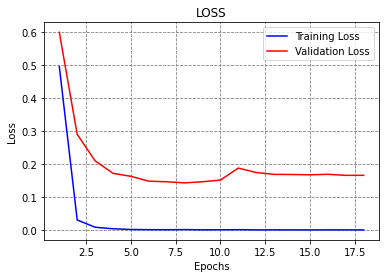

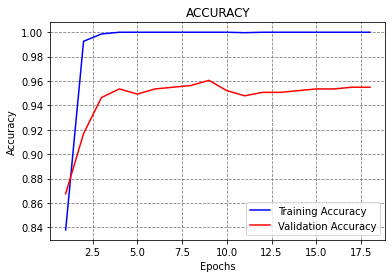

In [ ]:
history = np.load(p1_path + 'model/' + "Trans_ResnetHistoryDict.npy",allow_pickle=True).item()
plot_acc_loss(history)

**Observation**: The utilized *FIGRIM* dataset only has $4436$ images and $10$ scenes, in contrast to the delineation of $11$ sets in the [assignment document](https://canvas.uidaho.edu/courses/18542/files/1736828?wrap=1). There may be one missing category not included in the uploaded dataset. 

When I referred to the [FIGRIM Dataset](http://figrim.mit.edu/), it recorded that the dataset consists of $21$ scene categories, much more away from $11$. Therefore I used the shared dataset with $ 10 $ categories and set the corresponding parameters as $ 10 $ in my program.

## Part I. Task 2

### Step 1. Select an image

In [ ]:
all_images = np.load(p1_path + "all_images.npy")
all_labels = np.load(p1_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=11)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 10)
test_labels_onehot = keras.utils.to_categorical(test_labels, 10)
val_labels_onehot = keras.utils.to_categorical(val_labels, 10)

In [ ]:
loaded_model = load_model(p1_path + 'model/' + "trans_res.h5")

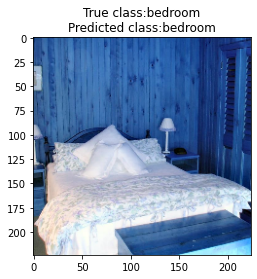

In [ ]:
plt.imshow(test_images[0].astype(np.uint))
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}

true_class = labels_dict[test_labels[0]]
predicted_class = labels_dict[np.argmax(loaded_model.predict(test_images[:1]))]
plt.title('True class:' + true_class+ '\n' + 'Predicted class:' + predicted_class)
plt.show()

### Step 2. Untargeted boundry attack

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 error 40100.4917356968 and class label amusement_park.


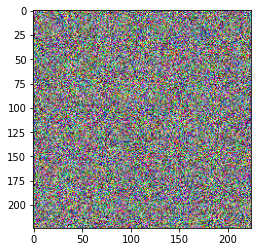

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 20. L2 error 16482.96420047697 and class label mountain.


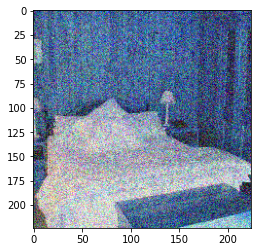

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 40. L2 error 11714.598832250302 and class label mountain.


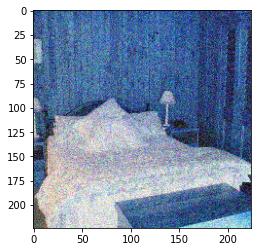

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 60. L2 error 9340.078417166902 and class label mountain.


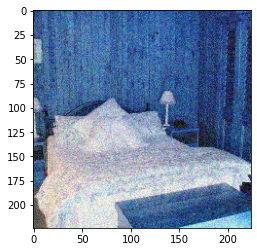

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 80. L2 error 8420.491608275433 and class label mountain.


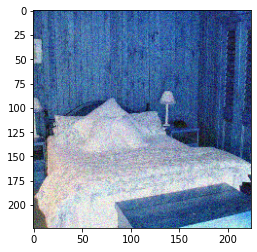

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 100. L2 error 7695.488409865585 and class label mountain.


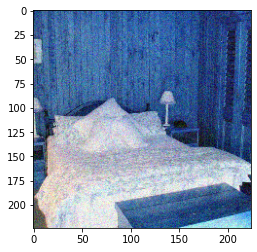

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 120. L2 error 6682.612255078838 and class label mountain.


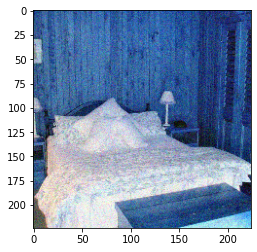

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 140. L2 error 6270.382541685199 and class label mountain.


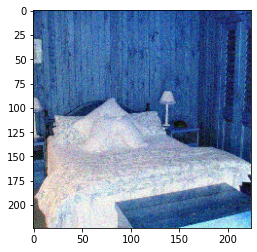

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 160. L2 error 5812.242917370548 and class label mountain.


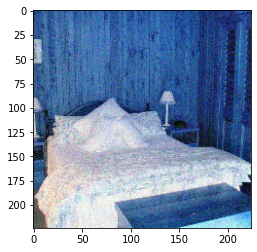

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 180. L2 error 5594.66521674398 and class label mountain.


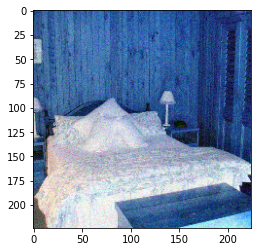

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 200. L2 error 5326.543368067464 and class label mountain.


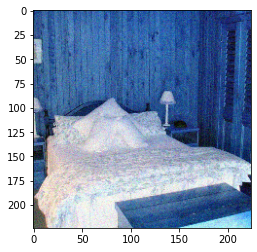

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 220. L2 error 5167.335705407236 and class label mountain.


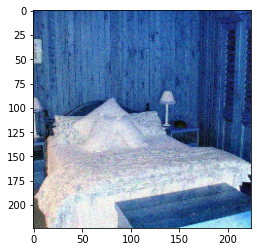

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 240. L2 error 5007.359535821515 and class label mountain.


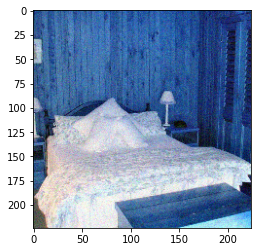

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 260. L2 error 4812.004526693887 and class label mountain.


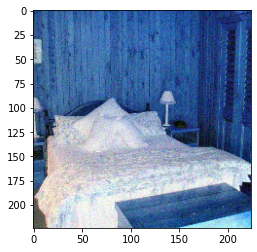

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 280. L2 error 4674.420054639333 and class label mountain.


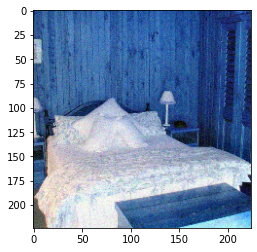

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 300. L2 error 4569.873929861891 and class label mountain.


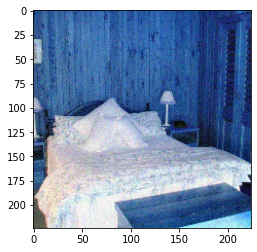

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 320. L2 error 4466.886984201772 and class label mountain.


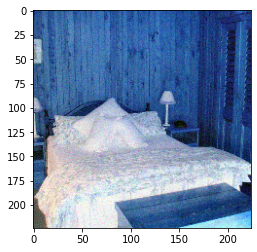

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 340. L2 error 4317.364906980243 and class label mountain.


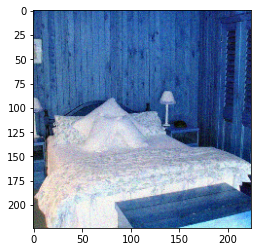

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 360. L2 error 4177.641740162125 and class label mountain.


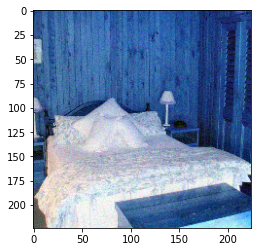

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/20 [00:00<?, ?it/s]

Adversarial image at step 380. L2 error 4039.7375939986837 and class label mountain.


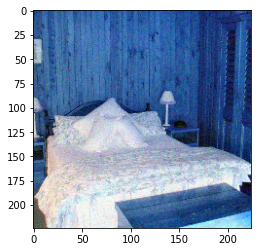

In [ ]:
classifier = KerasClassifier(clip_values=(0, 255), model=loaded_model)
attack = BoundaryAttack(estimator=classifier, targeted=False, max_iter=0, delta=0.001, epsilon=0.001)
iter_step = 20
x_adv = None
target_image = test_images[0]
for i in range(20):
    x_adv = attack.generate(x=np.array([target_image[..., ::-1]]), x_adv_init=x_adv)

    #clear_output()
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image[..., ::-1], [-1])),
          "and class label %s." % labels_dict[np.argmax(classifier.predict(x_adv)[0])])
    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)
    
    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step 
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break

### Step 3. Plot the generated adversarial image

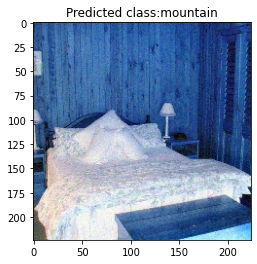

In [ ]:
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}
predicted_class = labels_dict[np.argmax(classifier.predict(x_adv))]
plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
plt.title('Predicted class:' + predicted_class)
plt.show(block=False)

### Step 4. Plot the difference

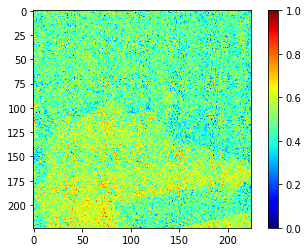

In [ ]:
diff = (original_img - attacked_img)
def rgb2gray(rgb):
    #return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    return np.dot(rgb[...,:3], [0.33, 0.33, 0.33])

def get_norm(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

diff = rgb2gray(diff)
diff = get_norm(diff)

plt.imshow(diff, cmap=plt.get_cmap('jet'), vmin=0, vmax=1)
plt.colorbar()

### Report


The boundary attack is a typical black-box attack. The malicious users generate an image with significant perturbation and feed it into the targeted model to obtain a wrong prediction. Then the algorithm will start a series of iterations to narrow the norm between generated noise image and one base image, in this case, a bedroom, while maintaining the mislabeled prediction. After several iterations, the norm will get reduced to a reasonable range in which the generated image would become hard to recognize by a human at one glance.

## Part I. Task 3

### Step 1. Select a base image

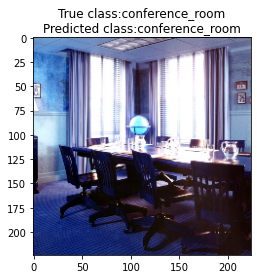

In [ ]:
base_image_index = 123
plt.imshow(test_images[base_image_index].astype(np.uint))
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}
true_class = labels_dict[test_labels[base_image_index]]
predicted_class = labels_dict[np.argmax(loaded_model.predict(test_images[base_image_index:base_image_index + 1]))]
plt.title('True class:' + true_class+ '\n' + 'Predicted class:' + predicted_class)
plt.show()

### Step 2. Select a target image

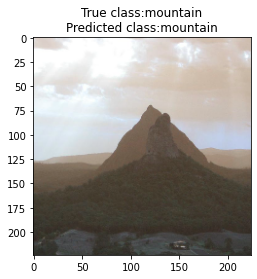

In [ ]:
target_image_index = 789
plt.imshow(test_images[target_image_index].astype(np.uint))
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}
true_class = labels_dict[test_labels[target_image_index]]
predicted_class = labels_dict[np.argmax(loaded_model.predict(test_images[target_image_index: target_image_index + 1]))]
plt.title('True class:' + true_class+ '\n' + 'Predicted class:' + predicted_class)
plt.show()

### Step 3. Perform targeted attack

In [ ]:
all_images = np.load(p1_path + "all_images.npy")
all_labels = np.load(p1_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=11)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 10)
test_labels_onehot = keras.utils.to_categorical(test_labels, 10)
val_labels_onehot = keras.utils.to_categorical(val_labels, 10)

In [ ]:
loaded_model = load_model(p1_path + 'model/' + "trans_res.h5")

Instructions for updating:
Colocations handled automatically by placer.


Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations: 0it [00:00, ?it/s]

Adversarial image at step 0. L2 error 30329.868298428202 and class label conference_room.


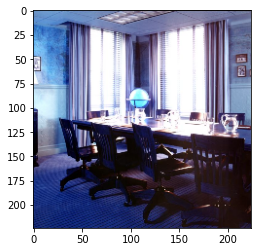

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 200. L2 error 7772.055365405363 and class label conference_room.


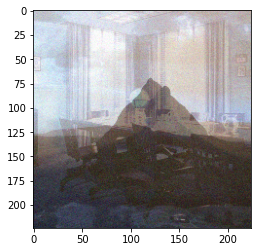

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 400. L2 error 4738.318284197074 and class label conference_room.


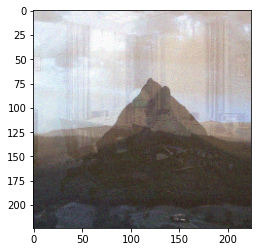

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 600. L2 error 3249.654652780581 and class label conference_room.


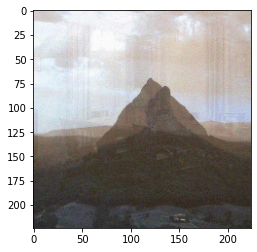

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 800. L2 error 2604.253019297373 and class label conference_room.


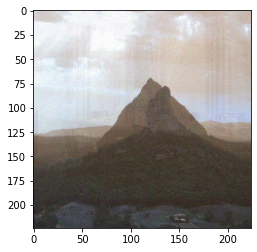

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1000. L2 error 2149.8427469575045 and class label conference_room.


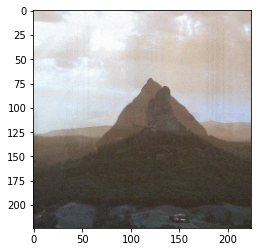

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1200. L2 error 1873.9028266431867 and class label conference_room.


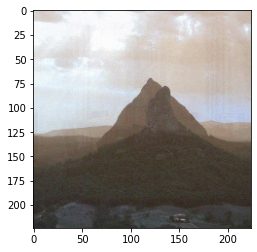

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1400. L2 error 1589.046242613355 and class label conference_room.


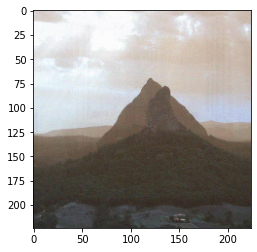

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1600. L2 error 1360.374523850748 and class label conference_room.


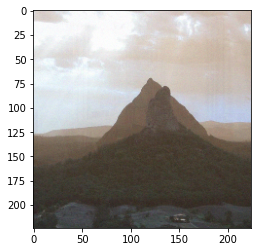

Boundary attack:   0%|          | 0/1 [00:00<?, ?it/s]

Boundary attack - iterations:   0%|          | 0/200 [00:00<?, ?it/s]

Adversarial image at step 1800. L2 error 1196.9848283526767 and class label conference_room.


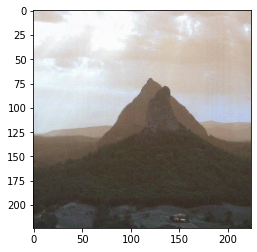

In [ ]:
base_image_index = 123
target_image_index = 789

classifier = KerasClassifier(clip_values=(0, 255), model=loaded_model)
iter_step = 200

#x_adv = test_images[base_image_index][np.newaxis, :, :, :]
x_adv = np.array([test_images[base_image_index][..., ::-1]])
target_image = test_images[target_image_index]
#target_image = test_images[target_image_index][..., ::-1]

attack = BoundaryAttack(estimator=classifier, targeted=True, max_iter=0, delta=0.001, epsilon=0.001)
labels_dict = {0: 'airport_terminal', 1: 'amusement_park', 2: 'bedroom', 3: 'bridge', 4: 'castle', 5: 'conference_room', 6: 'golf_course', 7: 'highway', 8: 'mountain', 9: 'playground'}

for i in range(10):
    x_adv = attack.generate(x=np.array([target_image[..., ::-1]]), y=to_categorical([test_labels[base_image_index]], 10), x_adv_init=x_adv)

    #clear_output()    
    print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
          np.linalg.norm(np.reshape(x_adv[0] - target_image[..., ::-1], [-1])),
          "and class label %s." % labels_dict[np.argmax(classifier.predict(x_adv)[0])])
    plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
    plt.show(block=False)
    
    if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
        attack.max_iter = iter_step 
        attack.delta = attack.curr_delta
        attack.epsilon = attack.curr_epsilon
    else:
        break

# for i in range(20):
#     x_adv = attack.generate(x=target_image, y=test_labels_onehot[base_image_index], x_adv_init=x_adv)

#     #clear_output()    
#     print("Adversarial image at step %d." % (i * iter_step), "L2 error", 
#           np.linalg.norm(np.reshape(x_adv[0] - target_image[0], [-1])),
#           "and class label %s." % labels_dict[np.argmax(classifier.predict(x_adv)[0])])
#     plt.imshow(x_adv[0][..., ::-1].astype(np.uint))
#     plt.show(block=False)
    
#     if hasattr(attack, 'curr_delta') and hasattr(attack, 'curr_epsilon'):
#         attack.max_iter = iter_step 
#         attack.delta = attack.curr_delta
#         attack.epsilon = attack.curr_epsilon
#     else:
#         break

### Report

Applying a targeted boundary attack is similar to the process in task 2. One tricky point is that the art package has a particular definition of `to_categorical`. Therefore the original one-hot encoded labels are not suitable for the attack function. I spent quite a while to fix this bug.

Regarding the targeted boundary attack, it initializes the attack model with one base image and the corresponding label. Thus the attack is generated based on the initial image with the same label instead of random values.

Compared to the untargeted task, this targeted task consumed more iterations to narrow the norm. I think that depends on the original differences between the initial and targeted images.

# Part II

## Part II. Task 1

<a name = "load-data-anchor"></a>
### Load dataset

In [ ]:
# Uncompress the dataset 
!unzip -uq "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/Dataset_dog_breeds.zip" -d "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/"

In [ ]:
# Function to load the images 
def load_images(directory):

    imgs_list = []

    # List of all images in the directory
    imgs_list_1 = listdir(directory)
    # Make sure that the images are sorted 
    imagesList = natsort.natsorted(imgs_list_1)

    # Read the images as numpy arrays
    for i in range(len(imagesList)):
          tmp_img = cv2.imread(os.path.join(directory, imagesList[i]))
          #resized_img = cv2.resize(tmp_img, (128, 128)) # in case of OOM error
          img_arr = np.array(tmp_img)
          imgs_list.append(img_arr.astype(float)) # it occured to me that applying normalization here will damage the val_acc
          #imgs_list.append(img_arr/255.)
    # Convert the lists to numpy arrays
    imgs = np.asarray(imgs_list)

    return imgs

# Load the images
all_images = load_images('/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/Dataset_dog_breeds')
print('Shape of the images:', all_images.shape)


Shape of the images: (1961, 256, 256, 3)


In [ ]:
# Load the labels
all_labels = np.loadtxt('/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/labels_dog_breeds.csv', delimiter=',').astype(int)
print('Shape of the labels:', all_labels.shape)

Shape of the labels: (1961,)


In [ ]:
#p2_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p2/"
np.save(p2_path + 'all_images', all_images)
np.save(p2_path + 'all_labels', all_labels)

In [ ]:
all_images = np.load(p2_path + "all_images.npy")
all_labels = np.load(p2_path + "all_labels.npy")

In [ ]:
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=12)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images
train_labels_onehot = keras.utils.to_categorical(train_labels, 12)
test_labels_onehot = keras.utils.to_categorical(test_labels, 12)
val_labels_onehot = keras.utils.to_categorical(val_labels, 12)

In [ ]:
# Display the shapes of train, validation, and test datasets
print('Images train shape: {} - Labels train shape: {}'.format(train_images.shape, train_labels.shape))
print('Images validation shape: {} - Labels validation shape: {}'.format(val_images.shape, val_labels.shape))
print('Images test shape: {} - Labels test shape: {}'.format(test_images.shape, test_labels.shape))

# Display the range of images (to make sure they are in the [0, 1] range)
print('\nMax pixel value', np.max(train_images))
print('Min pixel value', np.min(train_images))
print('Average pixel value', np.mean(train_images))
print('Data type', train_images[0].dtype)

Images train shape: (1254, 256, 256, 3) - Labels train shape: (1254,)
Images validation shape: (314, 256, 256, 3) - Labels validation shape: (314,)
Images test shape: (393, 256, 256, 3) - Labels test shape: (393,)

Max pixel value 255.0
Min pixel value 0.0
Average pixel value 112.79524559901155
Data type float64


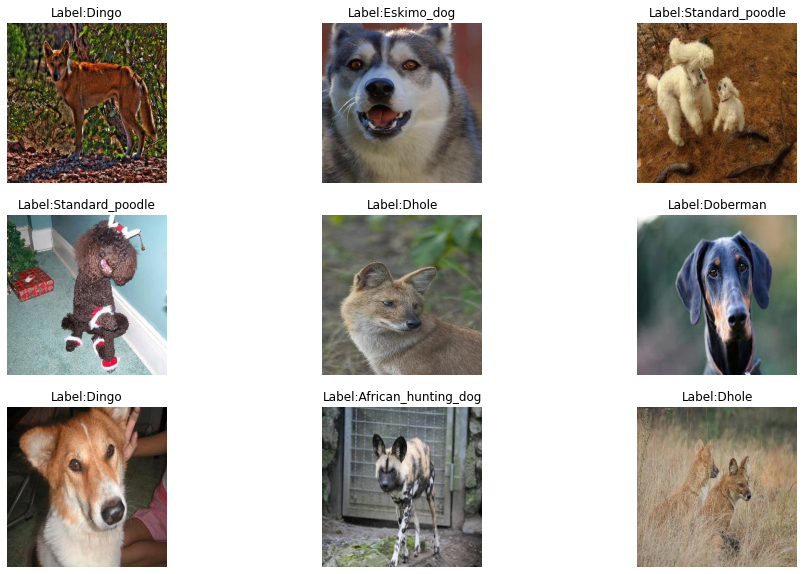

In [ ]:
# A list with the names of the image classes
label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', 
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

# Plot a few images to check if the labels make sense
plt.figure(figsize=(16, 10))
for n in range(9):
    i = np.random.randint(0, len(train_images), 1)
    ax = plt.subplot(3, 3, n+1)
    plt.imshow(train_images[i[0]].astype(np.uint))
    plt.title('Label:' + str(label_names[train_labels[i[0]]]))
    plt.axis('off')

### Train NN model

In [ ]:
all_images = np.load(p2_path + "all_images.npy")
all_labels = np.load(p2_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=11)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=11)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 12)
test_labels_onehot = keras.utils.to_categorical(test_labels, 12)
val_labels_onehot = keras.utils.to_categorical(val_labels, 12)

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256

base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3))
#base_model = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT,IMG_WIDTH,3))

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# x = Dense(1024, activation='relu')(x)
# x = Dropout(0.25)(x)
# x = Dense(256, activation='relu')(x)
# x = Dropout(0.2)(x)
predictions = Dense(12, activation='softmax')(x)

p2_trans_resnet = Model(inputs=base_model.input, outputs=predictions)
# for layer in base_model.layers:
#     layer.trainable = False

# trans_resnet.summary()


# The model we will train

p2_trans_resnet.compile(optimizer=Adam(learning_rate=1e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

PATIENCE = 5
callbacks = [EarlyStopping(monitor='val_loss',
                   patience = PATIENCE,
                   restore_best_weights=True),
             ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-7, verbose=1)
             #LRFinder(min_lr=1e-6, max_lr=1e-3)
            ]

In [ ]:
train_model = p2_trans_resnet
history = train_model.fit(x= train_images,
    y= train_labels_onehot,
    batch_size=64,
    epochs=30,
    # monitoring validation loss and metrics
    validation_data=(val_images, val_labels_onehot),
    verbose=1,
    callbacks=callbacks
)

Train on 1254 samples, validate on 314 samples
Epoch 1/30
1254/1254 [==============================] - 30s 24ms/sample - loss: 2.5373 - accuracy: 0.1523 - val_loss: 2.3650 - val_accuracy: 0.2038 - lr: 1.0000e-05
Epoch 2/30
1254/1254 [==============================] - 20s 16ms/sample - loss: 1.7415 - accuracy: 0.4553 - val_loss: 1.6826 - val_accuracy: 0.4331 - lr: 1.0000e-05
Epoch 3/30
1254/1254 [==============================] - 20s 16ms/sample - loss: 1.1957 - accuracy: 0.7249 - val_loss: 1.2176 - val_accuracy: 0.6051 - lr: 1.0000e-05
Epoch 4/30
1254/1254 [==============================] - 20s 16ms/sample - loss: 0.8387 - accuracy: 0.8628 - val_loss: 0.9373 - val_accuracy: 0.6975 - lr: 1.0000e-05
Epoch 5/30
1254/1254 [==============================] - 20s 16ms/sample - loss: 0.6011 - accuracy: 0.9258 - val_loss: 0.7703 - val_accuracy: 0.7611 - lr: 1.0000e-05
Epoch 6/30
1254/1254 [==============================] - 20s 16ms/sample - loss: 0.4402 - accuracy: 0.9617 - val_loss: 0.6680 - v

In [ ]:
model_name = "p2_trans_res.h5"
p2_model_path = os.path.join(p2_path, 'model/', model_name)
print(p2_model_path)

/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p2/model/p2_trans_res.h5


In [ ]:
#save the model
train_model.save(p2_model_path)

#save our history so we dont lose it.
np.save(p2_path + 'model/' + "p2_Trans_ResnetHistoryDict.npy", history.history)

In [ ]:
loaded_model = load_model(p2_path + 'model/' + "p2_trans_res.h5")

In [ ]:
# evals_test = loaded_model.evaluate(test_images, test_labels_onehot)
# print("Classification Accuracy Test: ", evals_test[1])

t = datetime.datetime.now()
evals_test = loaded_model.evaluate(train_images, train_labels_onehot)
print("Classification Accuracy Train: ", evals_test[1])
print('Inference time: %s' % (datetime.datetime.now() - t))


t = datetime.datetime.now()
evals_test = loaded_model.evaluate(val_images, val_labels_onehot)
print("Classification Accuracy Validation: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))


t = datetime.datetime.now()
evals_test = loaded_model.evaluate(test_images, test_labels_onehot)
print("Classification Accuracy Test: ", evals_test[1])
print('Inference time: %s \n' % (datetime.datetime.now() - t))


Classification Accuracy Train:  0.99920255
Inference time: 0:00:06.051093
Classification Accuracy Validation:  0.8630573
Inference time: 0:00:01.506835 

Classification Accuracy Test:  0.8396947
Inference time: 0:00:01.922145 



### Report

| **Model** | Train Set | Validation Set| Test Set |
|:---:|:---:|:---:|:---:|
| p2_Trans_Resnet | $0.9992$ | $0.8631$ | $0.8397$ |

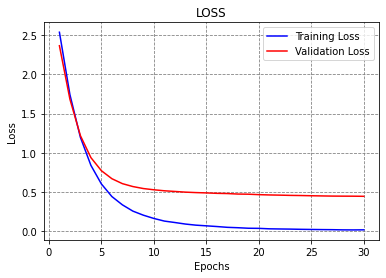

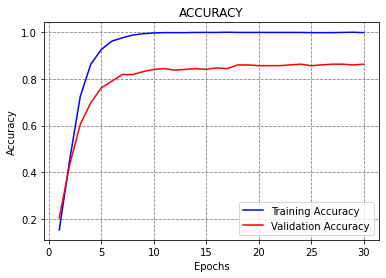

In [ ]:
history = np.load(p2_path + 'model/' + "p2_Trans_ResnetHistoryDict.npy",allow_pickle=True).item()
plot_acc_loss(history)

**Observations**:
The validation and test accuracy will be *ruined* if I apply normalization when loading the dog images by dividing 255 on each input image. In contrast, the training accuracy normally grows as the training progresses.

And when I removed the normalization of the input images, an original ResNet50 model could achieve over 85% accuracy on the test dataset of breed dogs.

I also tried the VGG16 model, resulting in the same consequence: during the training, the model achieved a high training accuracy, while the evaluation was terrible, even on the training set. The issue can be avoided by not normalizing the input image to $(0, 1)$. Got totally confused.

## Part II. Task 2

### Step 1. Select an image

In [ ]:
loaded_model = load_model(p2_path + 'model/' + "p2_trans_res.h5")

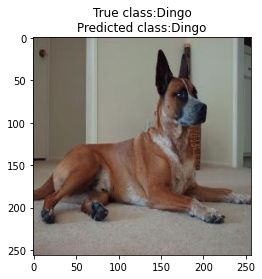

In [ ]:
base_image_index = 204
sample_dog_image = test_images[base_image_index].astype(np.uint)
plt.imshow(sample_dog_image.astype(np.uint))
# sample_dog_fig_path = p2_path + "sample_dog.png"
# plt.axis('off')
# plt.savefig(sample_dog_fig_path, bbox_inches='tight', pad_inches=0)
label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', \
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

true_class = label_names[test_labels[base_image_index]]
predicted_class = label_names[np.argmax(loaded_model.predict(test_images[base_image_index:base_image_index + 1]))]
plt.title('True class:' + true_class+ '\n' + 'Predicted class:' + predicted_class)
plt.show()

In [ ]:
adv_img = test_images[base_image_index]
sample_dog_fig_path = p2_path + "untargeted/untargeted_origin.png"
imageio.imwrite(sample_dog_fig_path, adv_img.astype(np.uint8))

<a name = "untargeted-clarifai-test"></a>
### Step 2. Test the Clarifai

![Clarifai test](./figures/clarifai_original.png)

### Step 3. Untargeted PGD attack

#### Prepare the PGD model

In [ ]:
class PGD_Attack:
    def __init__(self, IMAGE_DATASET = None, IMAGE_LABELS = None, TARGET_IMAGE_INDEX = None):
        self.image_dataset = IMAGE_DATASET.copy()
        self.image_labels = IMAGE_LABELS.copy()
        self.target_image_index = TARGET_IMAGE_INDEX

        # 'dingo'
        self.base_image_index = 204
        self.loaded_model = self.load_the_model()
        self.epsilon_list = [1/255, 3/255, 5/255, 8/255, 20/255, 50/255, 80/255]
        #self.epsilon_list = [1, 3, 5, 8, 20, 50, 80]
        #self.epsilon_list = [80/255, 100/255, 120/255, 140/255, 160/255, 180/255, 200/255]
        self.label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', \
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']
            

    def load_init_img(self):
        return self.image_dataset[self.base_image_index][np.newaxis, :, :, :]/255.

    def load_init_label(self):
        return self.image_labels[self.base_image_index][np.newaxis, :]

    def pgd_attack(self, Epsilon,Classifier,Imgs_Test,Targeted, Labels=None):
        
        attackPgd = ProjectedGradientDescent(estimator = Classifier,
                                            eps=(Epsilon/255),
                                            targeted=Targeted,
                                            batch_size =256)
        
        #check our parameters and perform the proper actions
        #if we have labels and we are targeted we can generate the proper images
        if Targeted == True and Labels is not None:
            return attackPgd.generate(Imgs_Test,Labels)
        
        #We just want to perturbe the image set without any targeting.
        elif Targeted == False:
            return attackPgd.generate(Imgs_Test)
        
        #some form of parameter error
        else:
            print("make sure you have given the function: pgd_attack a set of labels if you are doing targeted attacks")
            print("Stopping program ...")
            sys.exit()

    def load_the_model(self):
        MODEL_DIR = "model/"
        model_name = "p2_trans_res.h5"
        working_path = os.path.join(p2_path, MODEL_DIR, model_name)
        #print(working_path)
        #load our already trained model
        loaded_model = load_model(working_path)
        return loaded_model

    def train_model(self):
        #List for plotting and storing images to display. 
        self.init_img = self.load_init_img()
        self.labels_adv_cat = self.load_init_label()
        

        pgd_acc_list = []
        pgd_image_list = []
        pgd_pred_list = []
        pgd_pertb_list = []
        pgd_image_whole_list = []

        epsilon_list = self.epsilon_list

        classifier = KerasClassifier(model=self.loaded_model, clip_values=(0, 255))

        # self.imgs_adv = test_images[0:200,:,:,:].copy()
        # self.labels_adv_cat = test_labels_onehot[0:200].copy()

        for eps in epsilon_list:
            if None == self.target_image_index:
                imgs_adv_pgd = self.pgd_attack(eps*255,classifier,self.init_img,Targeted=False,Labels=self.labels_adv_cat)
            else:
                targeted_label = keras.utils.to_categorical(self.target_image_index, 12)[np.newaxis, :]

                imgs_adv_pgd = self.pgd_attack(eps*255,classifier,self.init_img,Targeted=True,Labels=targeted_label)
            
            # fgsm_image_list.append(imgs_adv_fgsm[0])
            # pgd_image_list.append(imgs_adv_pgd[0])
            
            pgd_image_whole_list.append(imgs_adv_pgd)
            
            #loss_test_pgd, accuracy_test_pgd = self.loaded_model.evaluate(imgs_adv_pgd, self.labels_adv_cat)
            
            #pgd_acc_list.append(accuracy_test_pgd)
            
            #predict first image
            prediction_pgd = self.loaded_model.predict(imgs_adv_pgd[0:1,:,:,:]*255)
            
            pgd_pred_list.append(prediction_pgd.argmax(axis=-1))

        # self.save_npy(fgsm_image_list, "fgsm_image_list")
        # self.save_npy(pgd_image_list, "pgd_image_list")
        self.save_npy(pgd_image_whole_list, "pgd_image_whole_list")
        #self.save_npy(pgd_acc_list, "pgd_acc_list")
        self.save_npy(pgd_pred_list, "pgd_pred_list")

    def get_np_path(self):
        if None == self.target_image_index:
            np_data_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p2/untargeted/"
        else:
            np_data_path = "/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/p2/targeted/"
        Path(np_data_path).mkdir(parents=True, exist_ok=True)
        return np_data_path

    def save_npy(self, NPY, FILENAME):
        NPY = np.asarray(NPY)
        # save the datasets as nparray
        np_data_path = self.get_np_path()
        np.save(np_data_path + FILENAME, NPY)

    def load_saved_npy(self):
        np_data_path = self.get_np_path()
        # self.fgsm_image_list = np.load(np_data_path + "fgsm_image_list.npy")
        # self.pgd_image_list = np.load(np_data_path + "pgd_image_list.npy")
        self.pgd_image_whole_list = np.load(np_data_path + "pgd_image_whole_list.npy")
        #self.pgd_acc_list = np.load(np_data_path + "pgd_acc_list.npy")
        self.pgd_pred_list = np.load(np_data_path + "pgd_pred_list.npy")



In [ ]:
all_images = np.load(p2_path + "all_images.npy")
all_labels = np.load(p2_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=12)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 12)
test_labels_onehot = keras.utils.to_categorical(test_labels, 12)
val_labels_onehot = keras.utils.to_categorical(val_labels, 12)

label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', \
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

#### Train the model

In [ ]:
pa1 = PGD_Attack(test_images, test_labels_onehot)
pa1.train_model()

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

#### Result visualizations

In [ ]:
pa1v = PGD_Attack(test_images, test_labels_onehot)
pa1v.load_saved_npy()

In [ ]:
label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', \
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

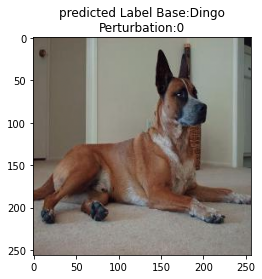

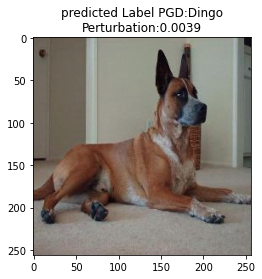

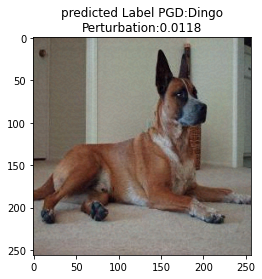

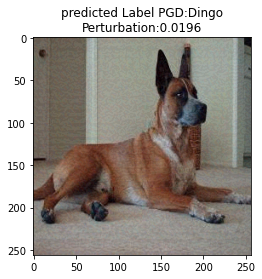

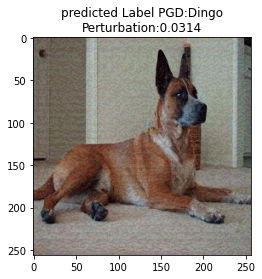

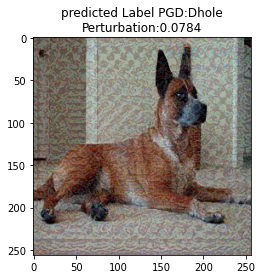

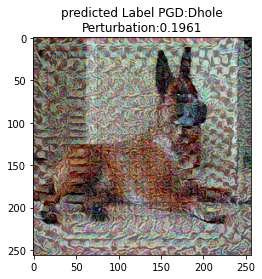

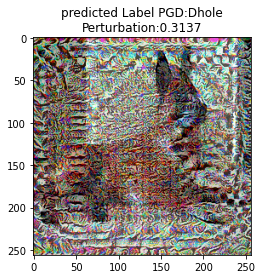

In [ ]:
def show_images(EpsilonIndex, PA):
    #plt.figure(figsize=(16, 16), dpi=150)
    
    # plt.subplot(2,3,1)
    # plt.title('predicted Label Base:' + str(label_names[np.argmax(PA.labels_adv_cat[0])])+ '\n' + 'Perturbation:' + str(0))
    # plt.imshow(PA.imgs_adv[0])

    #plt.subplot(2,3,3)
    plt.title('predicted Label PGD:' + str(label_names[int(PA.pgd_pred_list[EpsilonIndex])])+ '\n' + 'Perturbation:' + str(round(PA.epsilon_list[EpsilonIndex],4)))
    plt.imshow(PA.pgd_image_whole_list[EpsilonIndex][0])
    #fig_filename = "task2_c" + str(EpsilonIndex) + ".png"
    #fig_path = os.path.join("/content/drive/MyDrive/Colab_Notebooks/CS504/assg#1/figure/", fig_filename)
    #plt.savefig(fig_path, bbox_inches='tight', pad_inches=0)

    adv_img = PA.pgd_image_whole_list[EpsilonIndex][0]
    untarget_dog_fig_path = p2_path + "untargeted/untargeted_eps" + str(EpsilonIndex) +".png"
    imageio.imwrite(untarget_dog_fig_path, adv_img)
    plt.show()

def show_all_images(PA):
    plt.title('predicted Label Base:' + str(label_names[np.argmax(PA.load_init_label()[0])])+ '\n' + 'Perturbation:' + str(0))
    plt.imshow(PA.load_init_img()[0])
    plt.show()
    #new_epsilon = [3/255, 8/255, 20/255, 50/255, 80/255]
    #epsilon_list = [1/255, 3/255, 5/255, 8/255, 20/255, 50/255, 80/255]
    for index, item in enumerate(PA.epsilon_list):
        show_images(index, PA)

    #plt.show()
show_all_images(pa1v)

#### Test Clarifai

![Clarifai e5](./figures/untargeted/clarifai_e5.png)

Clarifai conducted a wrong prediction with $\epsilon = 50/255$ by misclassifying a *Dingo* to a *Chesapeake Bay Retriever*.

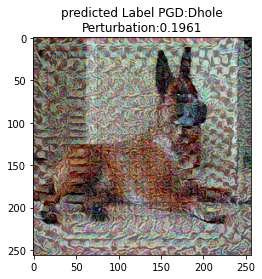

In [ ]:
eps_index = 5
plt.title('predicted Label PGD:' + str(label_names[int(pa1v.pgd_pred_list[eps_index])])+\
          '\n' + 'Perturbation:' + str(round(pa1v.epsilon_list[eps_index],4)))
plt.imshow(pa1v.pgd_image_whole_list[eps_index][0])

### Step 4. Tageted PGD attack

#### Train the model

In [ ]:
all_images = np.load(p2_path + "all_images.npy")
all_labels = np.load(p2_path + "all_labels.npy")
# Split into train, test, and validation sets
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=12)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images

train_labels_onehot = keras.utils.to_categorical(train_labels, 12)
test_labels_onehot = keras.utils.to_categorical(test_labels, 12)
val_labels_onehot = keras.utils.to_categorical(val_labels, 12)

In [ ]:
targeted_index = 6
print("Target dog: ", label_names[targeted_index])
pa2 = PGD_Attack(test_images, test_labels_onehot, targeted_index)
pa2.train_model()

Target dog:  Cardigan


PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

PGD - Random Initializations:   0%|          | 0/1 [00:00<?, ?it/s]

PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]

#### Result visualizations

In [ ]:
targeted_index = 6
label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', \
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

In [ ]:
print("Target dog: ", label_names[targeted_index])
pa2v = PGD_Attack(test_images, test_labels_onehot, targeted_index)
pa2v.load_saved_npy()

Target dog:  Cardigan


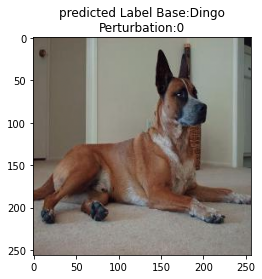

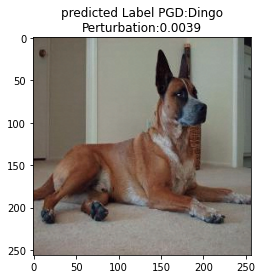

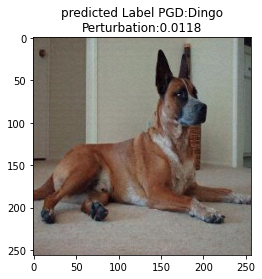

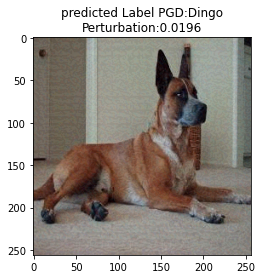

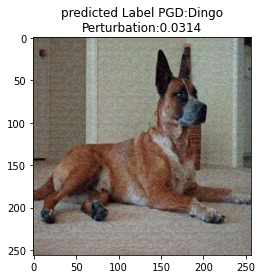

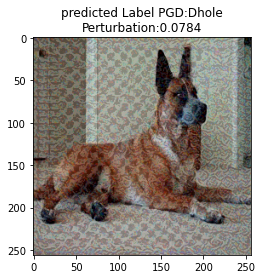

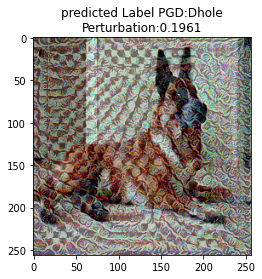

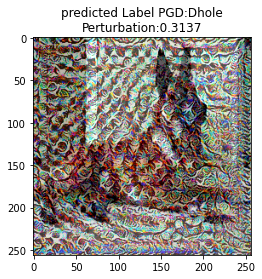

In [ ]:
def show_images(EpsilonIndex, PA):
    #plt.figure(figsize=(16, 16), dpi=150)
    
    # plt.subplot(2,3,1)
    # plt.title('predicted Label Base:' + str(label_names[np.argmax(PA.labels_adv_cat[0])])+ '\n' + 'Perturbation:' + str(0))
    # plt.imshow(PA.imgs_adv[0])

    #plt.subplot(2,3,3)
    plt.title('predicted Label PGD:' + str(label_names[int(PA.pgd_pred_list[EpsilonIndex])])+ '\n' + 'Perturbation:' + str(round(PA.epsilon_list[EpsilonIndex],4)))
    plt.imshow(PA.pgd_image_whole_list[EpsilonIndex][0])
    #fig_filename = "task2_c" + str(EpsilonIndex) + ".png"
    #fig_path = os.path.join("/content/drive/MyDrive/Colab_Notebooks/CS504/assg#1/figure/", fig_filename)
    #plt.savefig(fig_path, bbox_inches='tight', pad_inches=0)
    adv_img = PA.pgd_image_whole_list[EpsilonIndex][0]
    untarget_dog_fig_path = p2_path + "targeted/targeted_eps" + str(EpsilonIndex) +".png"
    imageio.imwrite(untarget_dog_fig_path, adv_img)
    plt.show()

def show_all_images(PA):
    plt.title('predicted Label Base:' + str(label_names[np.argmax(PA.load_init_label()[0])])+ '\n' + 'Perturbation:' + str(0))
    plt.imshow(PA.load_init_img()[0])
    plt.show()
    #new_epsilon = [3/255, 8/255, 20/255, 50/255, 80/255]
    #epsilon_list = [1/255, 3/255, 5/255, 8/255, 20/255, 50/255, 80/255]
    for index, item in enumerate(PA.epsilon_list):
        show_images(index, PA)

    #plt.show()
show_all_images(pa2v)

#### Test Clarifai

![Clarifai e4](./figures/targeted/clarifai_e4.png)

Clarifai conducted a wrong prediction with $\epsilon = 20/255$ by misclassifying a *Dingo* to a *Malinois*. While this target is *Cardigan*. Therefore the targeted attack failed.

### Report

**Background**

In this project, my local neural network model of `p2_Trans_ResNet50` is trained on a non-normalized dataset. Therefore the `clip_values` for the classifier in the SGD model is $(0, 255)$, instead of $(0, 1)$, in contrast to the last assignment. 

In that case, during the PGD attack, the loaded base image will be normalized by dividing $255.$. And it would get multiplied by $255.$ again when the `p2_Trans_ResNet50` model predicted it.

The local deep learning network outperformed the online Clarifai `dog-breeds-classifier` model in recognizing dog species. It could be partly because the online classifier has many more categories of dogs to recognize. Finding a dog image example that the online classifier can identify correctly in the primary stage can be challenging.

In addition, the online model is more vulnerable to small perturbations than the local model. 
In a discarded example of an untargeted SGD attack, my local model can resist PGD attack with $\epsilon < 50/255$ in the given an example. However, the Clarifai model can't resist the untargeted attack with $\epsilon = 1/255$. 
> I discarded this example because the Clarifai model has a small confidence on the original image at around $20\%$. 

**Case study**

In the untargeted attack, the Clarifai model misclassified the *Dingo* to  *Chesapeake Bay Retriever* with $\epsilon = 50/255$, and the corresponding confidence is $0.079$. The correct label of *Dingo* is ranked at $17$ with confidence of $0.005$.

Meanwhile, the local transferred `ResNet50` model misclassified this image as *Dhole* from $\epsilon = 20/255$.

In the targeted attack, I set the targeted label as *Cardigan*, a shared label between the local and Clarifai dataset. However, this time the Clarifai model misclassified the ground truth *Dingo* label to *Malinois* at $\epsilon = 20/255$ with the confidence of $0.177$. While the confidence of target *Cardigan* is $0.010$ at the Rank $5$. In other words, the targeted attack on the Clarifai model failed.

The local model misclassified the *Dingo* to the false label of *Dhole* at the same $\epsilon = 20/255$ while still failing on the target of *Cardigan*. One of the reasons might be the limited dataset size.

In conclusion, the black-boxed attack of generating the perturbated image is transferable to a certain extent, consistent with our intuitive expectation. While performing a successful targeted attack might require more training data. And the selection of the base image and the target label is essential to the attack.


**P.S.**
Deep learning is a dangerous beast and is hard to tame.

The transferred model cannot functionally work on the normalized dataset for an unknown reason. The problem is the training accuracy can increase as the training goes on, while the accuracy on the validation dataset is sticking at around $10\%$ and never grows.

I copy&pasted the dataset loading and the NN training code from [Part II. Task 1.](#load-data-anchor). And I correspondingly modified the code to load the normalized dog images. If altered, I would record the changed codes at the first line of each cell.

I fixed this problem by using the not normalized dog image dataset. But I don't know why the normalization can be fatal to this neural network since it worked well on the last assignment with a normalized dataset.

### False example of training on normalized dataset

In [ ]:
# Load the normalized dataset, the difference is at line 17
def load_images(directory):

    imgs_list = []

    # List of all images in the directory
    imgs_list_1 = listdir(directory)
    # Make sure that the images are sorted 
    imagesList = natsort.natsorted(imgs_list_1)

    # Read the images as numpy arrays
    for i in range(len(imagesList)):
          tmp_img = cv2.imread(os.path.join(directory, imagesList[i]))
          #resized_img = cv2.resize(tmp_img, (128, 128)) # in case of OOM error
          img_arr = np.array(tmp_img)
          #imgs_list.append(img_arr.astype(float)) # it occured to me that applying normalization here will damage the val_acc
          imgs_list.append(img_arr/255.)
    # Convert the lists to numpy arrays
    imgs = np.asarray(imgs_list)

    return imgs

# Load the images
all_images = load_images('/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/Dataset_dog_breeds')
print('Shape of the images:', all_images.shape)


Shape of the images: (1961, 256, 256, 3)


In [ ]:
# Load the labels
all_labels = np.loadtxt('/content/drive/MyDrive/Colab_Notebooks/CS504/assg#2/data/labels_dog_breeds.csv', delimiter=',').astype(int)
print('Shape of the labels:', all_labels.shape)

Shape of the labels: (1961,)


In [ ]:
# Split into train, test, and validation sets as usual
trainval_images, test_images, trainval_labels, test_labels = train_test_split(all_images, all_labels, test_size=0.2, random_state=12)
train_images, val_images, train_labels, val_labels = train_test_split(trainval_images, trainval_labels, test_size=0.2, random_state=12)
del all_images
train_labels_onehot = keras.utils.to_categorical(train_labels, 12)
test_labels_onehot = keras.utils.to_categorical(test_labels, 12)
val_labels_onehot = keras.utils.to_categorical(val_labels, 12)

In [ ]:
# Display the shapes of train, validation, and test datasets
print('Images train shape: {} - Labels train shape: {}'.format(train_images.shape, train_labels.shape))
print('Images validation shape: {} - Labels validation shape: {}'.format(val_images.shape, val_labels.shape))
print('Images test shape: {} - Labels test shape: {}'.format(test_images.shape, test_labels.shape))

# Display the range of images (to make sure they are in the [0, 1] range)
print('\nMax pixel value', np.max(train_images))
print('Min pixel value', np.min(train_images))
print('Average pixel value', np.mean(train_images))
print('Data type', train_images[0].dtype)

Images train shape: (1254, 256, 256, 3) - Labels train shape: (1254,)
Images validation shape: (314, 256, 256, 3) - Labels validation shape: (314,)
Images test shape: (393, 256, 256, 3) - Labels test shape: (393,)

Max pixel value 1.0
Min pixel value 0.0
Average pixel value 0.44233429646671163
Data type float64


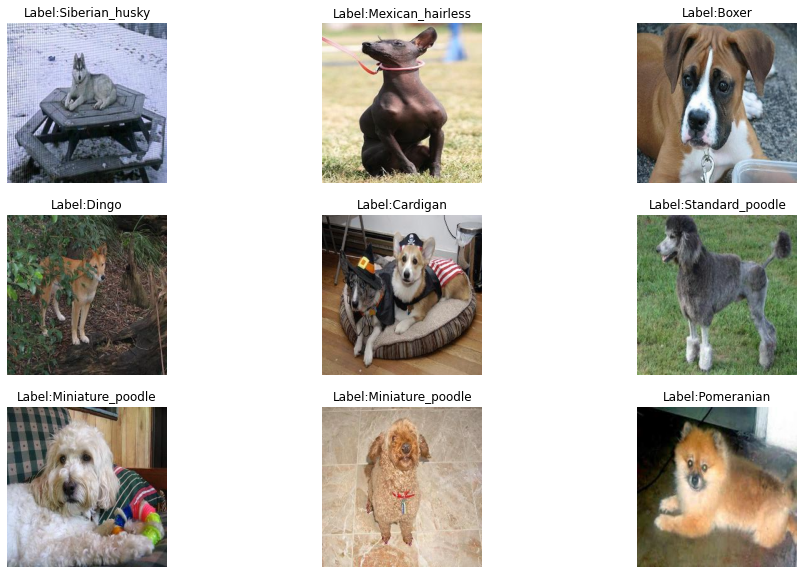

In [ ]:
# at line 11, as the images are normalized, then the `.astype(np.uint)` is no longer needed
# A list with the names of the image classes
label_names = ['African_hunting_dog', 'Dhole', 'Dingo', 'Mexican_hairless', 'Standard_poodle', 'Miniature_poodle', 
               'Cardigan', 'Pomeranian', 'Siberian_husky', 'Boxer', 'Doberman', 'Eskimo_dog']

# Plot a few images to check if the labels make sense
plt.figure(figsize=(16, 10))
for n in range(9):
    i = np.random.randint(0, len(train_images), 1)
    ax = plt.subplot(3, 3, n+1)
    #plt.imshow(train_images[i[0]].astype(np.uint))
    plt.imshow(train_images[i[0]])
    plt.title('Label:' + str(label_names[train_labels[i[0]]]))
    plt.axis('off')

In [ ]:
# at line 4 and 5, no matter which model is applied will result in same issue
# the remaining code is exact the same to the one used in my project
IMG_HEIGHT = 256
IMG_WIDTH = 256

#base_model = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT,IMG_WIDTH,3))
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3))

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(12, activation='softmax')(x)

false_trans_resnet = Model(inputs=base_model.input, outputs=predictions)

false_trans_resnet.compile(optimizer=Adam(learning_rate=1e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

PATIENCE = 5
callbacks = [EarlyStopping(monitor='val_loss',
                   patience = PATIENCE,
                   restore_best_weights=True),
             ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-7, verbose=1)
             #LRFinder(min_lr=1e-6, max_lr=1e-3)
            ]

Instructions for updating:
Colocations handled automatically by placer.


94765736/94765736 [==============================] - 4s 0us/step


In [ ]:
# I reduced the epoch counts to save the time
history = false_trans_resnet.fit(x= train_images,
    y= train_labels_onehot,
    batch_size=64,
    epochs=10,
    # monitoring validation loss and metrics
    validation_data=(val_images, val_labels_onehot),
    verbose=1,
    callbacks=callbacks
)

Train on 1254 samples, validate on 314 samples
Epoch 1/10
1254/1254 [==============================] - ETA: 0s - loss: 2.6335 - accuracy: 0.1204

/usr/local/lib/python3.8/dist-packages/keras/engine/training_v1.py:2333: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


1254/1254 [==============================] - 45s 36ms/sample - loss: 2.6335 - accuracy: 0.1204 - val_loss: 2.6066 - val_accuracy: 0.0701 - lr: 1.0000e-05
Epoch 2/10
1254/1254 [==============================] - 21s 16ms/sample - loss: 1.8160 - accuracy: 0.4219 - val_loss: 2.6147 - val_accuracy: 0.0732 - lr: 1.0000e-05
Epoch 3/10
1254/1254 [==============================] - 20s 16ms/sample - loss: 1.2588 - accuracy: 0.6938 - val_loss: 2.6651 - val_accuracy: 0.0828 - lr: 1.0000e-05
Epoch 4/10
1254/1254 [==============================] - ETA: 0s - loss: 0.8814 - accuracy: 0.8333
Epoch 4: ReduceLROnPlateau reducing learning rate to 2.9999999242136253e-06.
1254/1254 [==============================] - 21s 17ms/sample - loss: 0.8814 - accuracy: 0.8333 - val_loss: 2.7635 - val_accuracy: 0.0987 - lr: 1.0000e-05
Epoch 5/10
1254/1254 [==============================] - 20s 16ms/sample - loss: 0.6772 - accuracy: 0.8987 - val_loss: 2.8704 - val_accuracy: 0.0987 - lr: 3.0000e-06
Epoch 6/10
1254/1254 [

The transfered NN model with normalized dataset will even fail on validating with training set.

In [ ]:
# at line 4 and 5, no matter which model is applied will result in same issue
# the remaining code is exact the same to the one used in my project
IMG_HEIGHT = 256
IMG_WIDTH = 256

#base_model = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT,IMG_WIDTH,3))
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3))

# Add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
predictions = Dense(12, activation='softmax')(x)

false_trans_resnet = Model(inputs=base_model.input, outputs=predictions)

false_trans_resnet.compile(optimizer=Adam(learning_rate=1e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

PATIENCE = 5
callbacks = [EarlyStopping(monitor='val_loss',
                   patience = PATIENCE,
                   restore_best_weights=True),
             ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-7, verbose=1)
             #LRFinder(min_lr=1e-6, max_lr=1e-3)
            ]

In [ ]:
# at line 7, the validation_data is set as same as the train_images and train_labels_onehot
history = false_trans_resnet.fit(x= train_images,
    y= train_labels_onehot,
    batch_size=64,
    epochs=10,
    # monitoring validation loss and metrics
    validation_data=(train_images, train_labels_onehot),
    verbose=1,
    callbacks=callbacks
)

Train on 1254 samples, validate on 1254 samples
Epoch 1/10
1254/1254 [==============================] - 34s 27ms/sample - loss: 2.4538 - accuracy: 0.2041 - val_loss: 3.2189 - val_accuracy: 0.0750 - lr: 1.0000e-05
Epoch 2/10
1254/1254 [==============================] - 25s 20ms/sample - loss: 1.6889 - accuracy: 0.4896 - val_loss: 3.2094 - val_accuracy: 0.0750 - lr: 1.0000e-05
Epoch 3/10
1254/1254 [==============================] - 25s 20ms/sample - loss: 1.1875 - accuracy: 0.7289 - val_loss: 3.2207 - val_accuracy: 0.0750 - lr: 1.0000e-05
Epoch 4/10
1254/1254 [==============================] - 25s 20ms/sample - loss: 0.8379 - accuracy: 0.8628 - val_loss: 3.2303 - val_accuracy: 0.0853 - lr: 1.0000e-05
Epoch 5/10
1254/1254 [==============================] - ETA: 0s - loss: 0.5932 - accuracy: 0.9171
Epoch 5: ReduceLROnPlateau reducing learning rate to 2.9999999242136253e-06.
1254/1254 [==============================] - 27s 21ms/sample - loss: 0.5932 - accuracy: 0.9171 - val_loss: 3.2134 - v